In [1]:
import deeplabcut

2025-05-23 13:09:29.520666: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI AVX512_BF16 AVX_VNNI AMX_TILE AMX_INT8 AMX_BF16 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-23 13:09:29.933876: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-23 13:09:33.572864: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /n/app/python/3.9.14/lib:/n/app/python/

Loading DLC 2.2.3...
DLC loaded in light mode; you cannot use any GUI (labeling, relabeling and standalone GUI)


/n/scratch/users/a/adm808/envs/DLC_venv_py39/lib/python3.9/site-packages/deeplabcut/__init__.py:81: UserWarning: 
        As PyTorch is not installed, unsupervised identity learning will not be available.
        Please run `pip install torch`, or ignore this warning.
        
  warnings.warn(


In [2]:
config_path = '/n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/config.yaml'

Running  DLC_resnet50_ZoneDetection2Apr23shuffle1_1030000  with # of training iterations: 1030000
This net has already been evaluated!
Plotting...(attention scale might be inconsistent in comparison to when data was analyzed; i.e. if you used rescale)


/n/scratch/users/a/adm808/envs/DLC_venv_py39/lib/python3.9/site-packages/deeplabcut/utils/visualization.py:57: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  DataCombined[loopscorer][bp]["y"][imagenr]
/n/scratch/users/a/adm808/envs/DLC_venv_py39/lib/python3.9/site-packages/deeplabcut/utils/visualization.py:58: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  + DataCombined[loopscorer][bp]["x"][imagenr]
/n/scratch/users/a/adm808/envs/DLC_venv_py39/lib/python3.9/site-packages/deeplabcut/utils/visualization.py:61: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys w

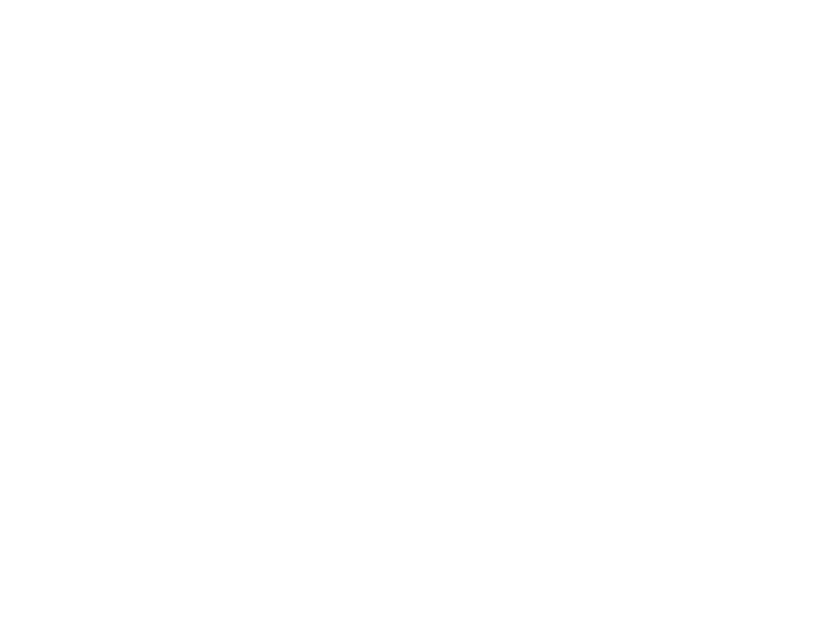

In [3]:
deeplabcut.evaluate_network(config_path, plotting=True)

In [4]:
config_path = "/n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/config.yaml"
eval_folder = "/n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/labeled-data/eval_set/"

In [10]:
import os
import shutil

# Original folder with all images
eval_folder = "/n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/labeled-data/eval_set"

# New destination folder for images WITHOUT 'raw' in filename
clean_folder = os.path.join(eval_folder, "no_raw")
os.makedirs(clean_folder, exist_ok=True)

# Copy each file that does NOT include 'raw' in the name
for fname in os.listdir(eval_folder):
    if fname.endswith(".png") and "raw" not in fname:
        src = os.path.join(eval_folder, fname)
        dst = os.path.join(clean_folder, fname)
        shutil.copy(src, dst)

print(f"Copied images without 'raw' to: {clean_folder}")

Copied images without 'raw' to: /n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/labeled-data/eval_set/no_raw


In [11]:
clean_folder

'/n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/labeled-data/eval_set/no_raw'

In [12]:
deeplabcut.analyze_time_lapse_frames(config_path, clean_folder,frametype='.png',shuffle=1,
                trainingsetindex=0,gputouse=None,save_as_csv=False)

Using snapshot-1030000 for model /n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/dlc-models/iteration-0/ZoneDetection2Apr23-trainset95shuffle1


/n/scratch/users/a/adm808/envs/DLC_venv_py39/lib/python3.9/site-packages/tensorflow/python/keras/engine/base_layer_v1.py:1694: UserWarning: `layer.apply` is deprecated and will be removed in a future version. Please use `layer.__call__` method instead.
  warnings.warn('`layer.apply` is deprecated and '


Analyzing all frames in the directory:  /n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/labeled-data/eval_set/no_raw
Starting to extract posture
Overall # of frames:  138  found with (before cropping) frame dimensions:  803 608


 94%|█████████▍| 130/138 [06:03<00:22,  2.79s/it]

Saving results in /n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/labeled-data/eval_set/no_raw...
The folder was analyzed. Now your research can truly start!
If the tracking is not satisfactory for some frame, consider expanding the training set.



/n/scratch/users/a/adm808/envs/DLC_venv_py39/lib/python3.9/site-packages/deeplabcut/utils/auxiliaryfunctions.py:390: FutureWarning: Starting with pandas version 3.0 all arguments of to_hdf except for the argument 'path_or_buf' will be keyword-only.
  DataMachine.to_hdf(dataname, "df_with_missing", format="table", mode="w")


In [16]:
import pandas as pd

h5_path = "/n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/labeled-data/eval_set/no_raw/no_rawDLC_resnet50_ZoneDetection2Apr23shuffle1_1030000.h5"
df = pd.read_hdf(h5_path)
print(df.head())

scorer                                DLC_resnet50_ZoneDetection2Apr23shuffle1_1030000  \
bodyparts                                                                        Zone1   
coords                                                                               x   
2011-04-13 18-35-24-C_frame_1167.png                                        426.087426   
2011-04-13 18-35-24-C_frame_12183.png                                       425.250053   
2011-04-13 18-35-24-C_frame_15944.png                                       423.699804   
2011-04-13 18-35-24-C_frame_20796.png                                       424.826699   
2011-04-13 18-35-24-C_frame_22610.png                                       420.953552   

scorer                                                                    \
bodyparts                                                          Zone2   
coords                                          y likelihood           x   
2011-04-13 18-35-24-C_frame_1167.png   477.844600  

/tmp/ipykernel_47099/680879511.py:37: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(loc="upper right", fontsize="small")


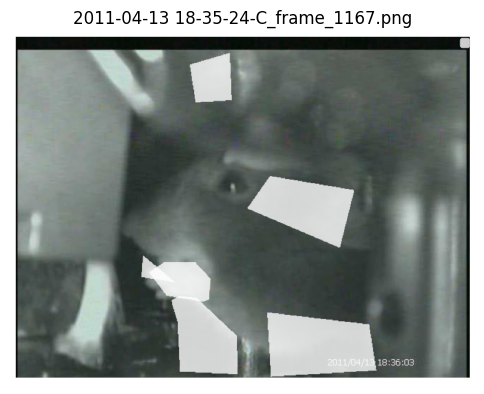

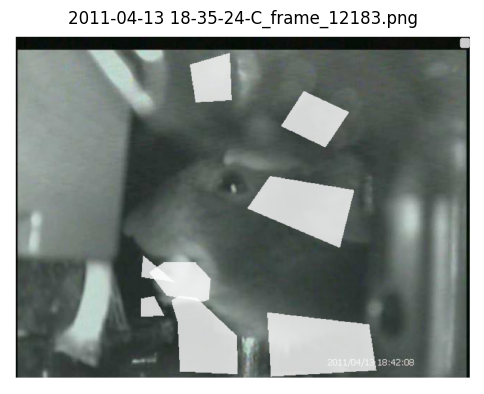

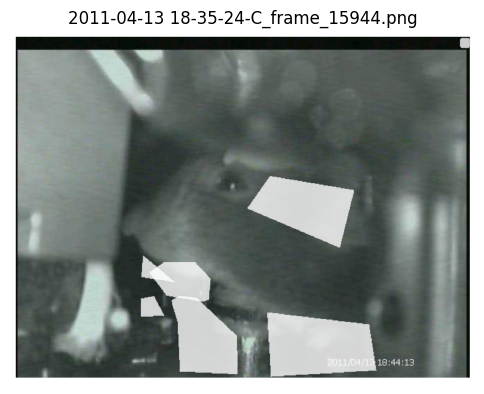

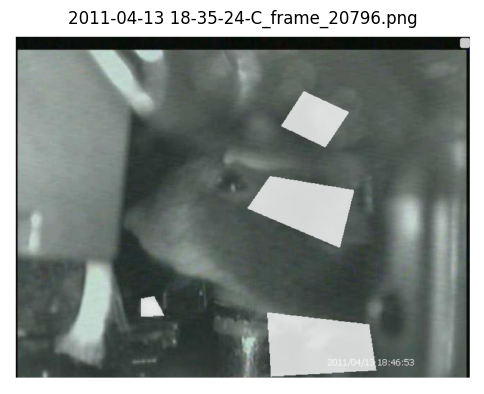

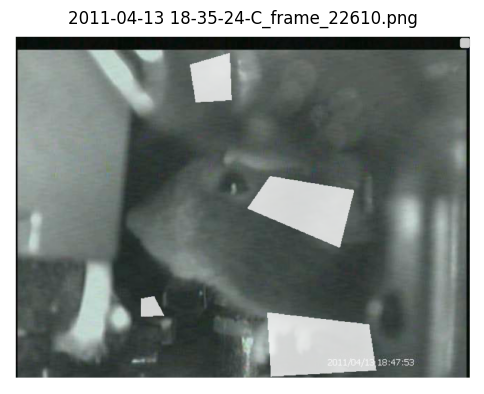

...

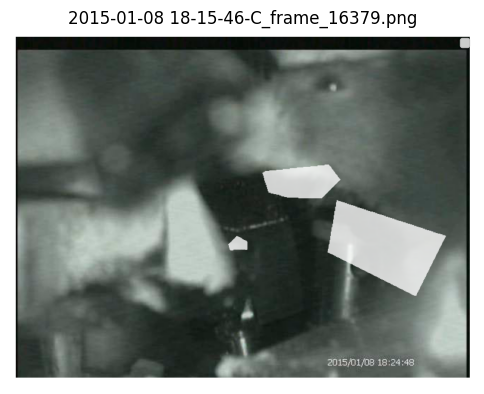

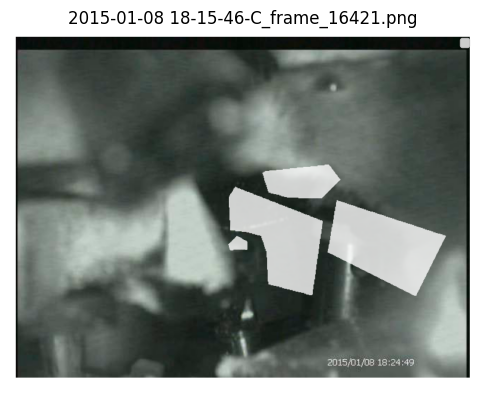

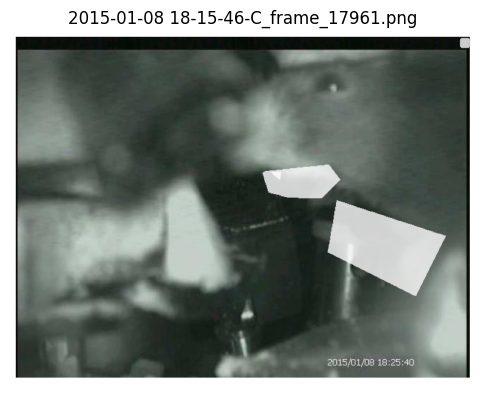

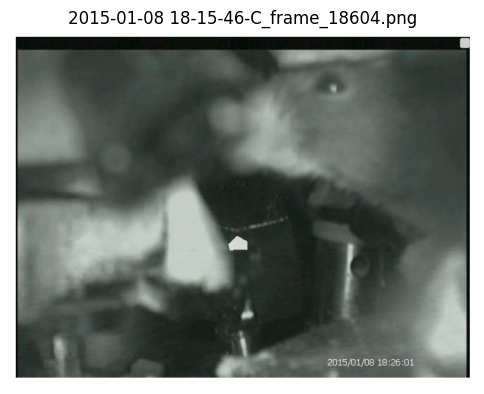

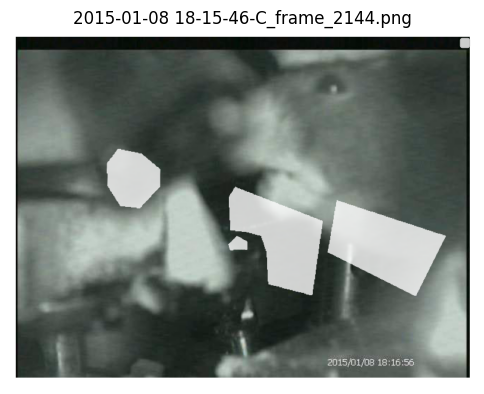

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import os

# Load DLC output
h5_path = "/n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/labeled-data/eval_set/no_raw/no_rawDLC_resnet50_ZoneDetection2Apr23shuffle1_1030000.h5"
df = pd.read_hdf(h5_path)

# Directories
frame_dir = "/n/scratch/users/a/adm808/Sabatini_Lab/ZoneDetection2-adi-2025-04-23/labeled-data/eval_set/no_raw/"

# List all .png frames in the folder
all_frames = [f for f in os.listdir(frame_dir) if f.endswith(".png")]

for fname in all_frames:
    row = df.loc[fname]
    zones = row.unstack(level=1)  # one column per Zone

    img = Image.open(os.path.join(frame_dir, fname))
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(img)
    ax.axis("off")

    for zone in zones.columns:
        try:
            lhood = zones[zone]["likelihood"]
            # For the zones that have a likelihood above 0.8 I will plot the zones
            if lhood > 0.8:
                x = zones[zone]["x"]
                y = zones[zone]["y"]
                circle = plt.Circle((x, y), radius=40, color='red', alpha=0.3, label=zone)
                ax.add_patch(circle)
        except KeyError:
            continue  # Skip zones with missing info

    ax.legend(loc="upper right", fontsize="small")
    ax.set_title(fname)

    plt.savefig(os.path.join(output_dir, fname.replace(".png", "_labeled.png")))
    plt.show()